# Globins0.9 - Comparison with others methods (PCA, KPCA, MDS, tSNE, UMAP, IsoMap)

In [10]:
import numpy as np
import os 
import pandas as pd
import plotly.express as px
import re
from sklearn.preprocessing import StandardScaler
from sklearn import decomposition

In [11]:
def plot_embedding_interactive_bis(array_emb, df_annot, 
                                   labels_name = None, 
                                   second_labels_name = None, 
                                   labels_text = None, 
                                   show_text = False, 
                                   title = None, 
                                   color_palette = None,
                                   fontsize = 10,
                                   width = 800, 
                                   height = 700):
    """ Function to plot interactive projections (exemple of methods : PCA, KPCA, MDS, TSNE, Umap, IsoMap)  
    Parameters : 
        array_emb : array, containing the embedding (initial data that are flatten)
        df_annot : dataframe, containing the annotation of data 
        labels_name : str, label that exists in the 'df_annot' for coloring the data 
        show_text : boolean, if True will show the labels given in the 'labels_text" 
        labels_text : list, list of labels to plot in the projection 
        title : str
        color_palette : dict, personnalized palette for color data 
        fontsize : int, size of title 
        width, heigth : int : dimension of the plot 
    Returns : 
        plt : plotly object, resulting plotly plot 
    """
    df_merge = pd.DataFrame(array_emb).merge(df_annot, left_index = True, right_index = True)  
    #print(df_annot.columns)
    #print(df_merge)

    # plot PM projection 
    plt = px.scatter(df_merge,x=0,y=1,color=df_merge[labels_name],color_discrete_map=color_palette,  
                     color_continuous_scale = "Turbo",
                     hover_name=labels_name, 
                     hover_data=df_annot.columns,
                     width=width, height=height)
    plt.update_layout(title_text=title, title_x=0.5, font_size=fontsize) # center the title 
    if show_text and (not (labels_text is None)):
        if (second_labels_name is None):
            texts = df_annot.loc[df_annot[labels_name].isin(labels_text)]
            labels_idx = texts.index
            #print(texts)
            for i in labels_idx: 
                plt.add_annotation(x=df_merge.loc[i,0], y=df_merge.loc[i,1],
                            text=texts.loc[i, labels_name],
                            showarrow=True,
                            arrowhead=1)
            plt.update_traces(textposition='top right')
        else: 
            texts = df_annot.loc[df_annot[second_labels_name].isin(labels_text)] 
            labels_idx = texts.index 
            for i in labels_idx: 
                plt.add_annotation(x=df_merge.loc[i,0], y = df_merge.loc[i,1], 
                                   text = texts.loc[i, second_labels_name],
                                   showarrow=True, 
                                   arrowhead=1) 
            plt.update_traces(textposition='top right') 
    #plt.update_xaxes(scaleanchor = "y", scaleratio = 1)
    plt.update_yaxes(scaleanchor = "x", scaleratio = 1)

    return plt

In [12]:
def pssm_matrix_into_array(repertory_path):
    """
    Construct PSSM matrix from .aamtx files.
    .aamtx file :  the AA distribution profil of each position of a sequence.
    Parameters : 
        repertory_path : str, the path of repertory containing the ".aamtx" files" 
    Returns : 
        protein_mat : list, containing probabilities of each AA, at each position for each sequence, as array
    """
    # count the total number of ".aamtx" files 
    nb_aatmx = len([filename for filename in os.listdir(repertory_path)  if re.search("\.aamtx", filename)])
    
    # read ".aamtx" files, flatten the content and append into a list
    protein_mat = [] 
    for i in range(1, nb_aatmx): 
        protein = pd.read_csv(repertory_path + "/"+str(i)+".aamtx" , header= None, sep =' ')
        protein = protein.loc[:,'0':'19'] 
        protein = np.asarray(protein) 
        protein = protein.flatten().T 
        protein_mat.append(protein) 
        
    protein_mat = np.asarray(protein_mat,) 
    protein_mat = pd.DataFrame(protein_mat) 
        

    return protein_mat 

In [88]:
# read the globin annotation csv file
globin_df = pd.read_csv("./data/globin_colors_new.csv", index_col = 0) 


# construct the palette
globin_palette = {-1 : "#c7c7c7", "OTHER": "#c7c7c7", "NA" : "#c7c7c7", "Uncharacterized" : "#c7c7c7", "root": "#000000",
                 "Nematostella": "#ad288b", "Amphimedon": "#fdb7fd", "Micromonas": "#4d9b03", "Saccoglossus":"#b0ffe8", "Trichoplax":"#e9bd6b" } 

# set color for individual species (i.e when plotting according to "short_species") 
globin_others_eukaryota = ["Amphimedon", # porifera 
 "Saccoglossus", # hemichordata
 "Trichoplax", # placozoa
 "Micromonas", # viridiplantae
 "Nematostella" ] # cnidaria  
 
globin_arthropoda = ["Stegodyphus", "Strigamia", "Scylla", "Carcinus",  "Ixodes", "Zootermopsis", "Coptotermes","Oryctes", "Tetranychus", 
                     "Acyrthosiphon", "Nemastomella","Apis","Solenopsis", "Habropoda", "Fopius", "Cerapachys", "Camponotus", "Nasonia", 
                     "Acromyrmex", "Tribolium", "Sarcoptes", "Lutzomyia", "Rhodnius", "Triatoma", "Cherax", "Chironomus", "Polypedilum", 
                     "Pediculus", "Daphnia", "Harpegnathos", "Artemia", "Parartemia", "Lepeophtheirus", "Glossina", "Operophtera"] 
  
globin_mollusca = ["Arion", "Crassostrea", "Lottia", "Anadara", "Spisula", "Barbatia", "Nassarius", "Cerithidea", "Nerita", "Phacoides",
                   "Octopus", "Biomphalaria"] 
globin_annelida = ["Capitella", "Metaphire"]  
globin_chordata = ["Scleropages", "Branchiostoma", "Xenopus", "Oreochromis", "Nothobranchius", "Gasterosteus", "Bos", "Iguana", "Oryzias", 
                   "Anas", "Tetraodon", "Takifugu", "Xiphophorus", "Larimichthys", "Oncorhynchus", "Alligator", "Astyanax", "Latimeria",
                   "Ictalurus", "Chaenocephalus", "Danio", "Cyprinus", "Callorhinchus", "Lepisosteus", "Chelonia", "Poecilia", "Ciona", 
                   "Petromyzon", "Lethenteron", "Cavia", "Scalopus", "Neotoma", "Pelodiscus","Fundulus", "Oryctolagus", "Anolis",
                   "Salmo", "Amazona", "Ornithorhynchus", "Sarcophilus", "Gallus", "Nomascus", "Tupaia"] 
 
globin_echinodermata = ["Caudina", "Strongylocentrotus", "Hemipholis", "Ophiactis"] 
globin_bacteria = ["Gemmatirosa", "Halothiobacillus"] 
globin_nematoda = ["Ancylostoma", "Necator", "Caenorhabditis", "Haemonchus", "Ascaris", "Trichinella", "Globodera", "Strongyloides", "Angiostrongylus"] 
globin_fungi = ["Blastobotrys", "Cyberlindnera"] 

#globin_palette.update(dict.fromkeys(globin_others_eukaryota, "#22ba69")) 
globin_palette.update(dict.fromkeys(globin_arthropoda, "#0b237c"))
globin_palette.update(dict.fromkeys(globin_mollusca, "#512ff8")) 
globin_palette.update(dict.fromkeys(globin_annelida, "#a191f3"))
globin_palette.update(dict.fromkeys(globin_chordata, "#26c9d9"))
globin_palette.update(dict.fromkeys(globin_echinodermata, "#086b75"))
globin_palette.update(dict.fromkeys(globin_bacteria, "#f10000"))
globin_palette.update(dict.fromkeys(globin_nematoda, "#5d78e3"))
globin_palette.update(dict.fromkeys(globin_fungi, "#a0e361"))
globin_palette.update(globin_color_tree) 

# set color for specie groups (i.e when plotting according to "Color_species")
globin_palette.update({"Arthropoda":  "#0b237c", "Mollusca":"#512ff8", "Annelida":"#a191f3", "Chordata": "#26c9d9", "Echinodermata":"#086b75", 
                  "Bacteria": "#f10000", "Nematoda":"#5d78e3", "Fungi":"#a0e361", "Porifera":"#fdb7fd", "Placozoa":"#e9bd6b",
                   "Viridiplantae":"#4d9b03", "Cnidaria":"#ad288b"})


# set color for tree cut 
tree_cut_number = [1,2,3,4,5,6,7,8,9,10, 11, 12,13,14,15,16,17,18,19,20,21,22,23,24,25,26]
color_discrete_alphabet = [color.lower() for color in px.colors.qualitative.Alphabet]
color_discrete_alphabet[8] = '#17becf'  # change color for another darker color 
globin_color_tree = zip(tree_cut_number,color_discrete_alphabet) 

In [8]:
globin_palette

{-1: '#c7c7c7',
 'OTHER': '#c7c7c7',
 'NA': '#c7c7c7',
 'Uncharacterized': '#c7c7c7',
 'root': '#000000',
 'Nematostella': '#ad288b',
 'Amphimedon': '#fdb7fd',
 'Micromonas': '#4d9b03',
 'Saccoglossus': '#b0ffe8',
 'Trichoplax': '#e9bd6b',
 'Stegodyphus': '#0b237c',
 'Strigamia': '#0b237c',
 'Scylla': '#0b237c',
 'Carcinus': '#0b237c',
 'Ixodes': '#0b237c',
 'Zootermopsis': '#0b237c',
 'Coptotermes': '#0b237c',
 'Oryctes': '#0b237c',
 'Tetranychus': '#0b237c',
 'Acyrthosiphon': '#0b237c',
 'Nemastomella': '#0b237c',
 'Apis': '#0b237c',
 'Solenopsis': '#0b237c',
 'Habropoda': '#0b237c',
 'Fopius': '#0b237c',
 'Cerapachys': '#0b237c',
 'Camponotus': '#0b237c',
 'Nasonia': '#0b237c',
 'Acromyrmex': '#0b237c',
 'Tribolium': '#0b237c',
 'Sarcoptes': '#0b237c',
 'Lutzomyia': '#0b237c',
 'Rhodnius': '#0b237c',
 'Triatoma': '#0b237c',
 'Cherax': '#0b237c',
 'Chironomus': '#0b237c',
 'Polypedilum': '#0b237c',
 'Pediculus': '#0b237c',
 'Daphnia': '#0b237c',
 'Harpegnathos': '#0b237c',
 'Artemia'

In [6]:
#globin_df.to_csv("./data/globin_colors_new.csv")

In [9]:
globin_df

,tree1,tree2,tree3,tree4,full_name,short_name,full_species,short_species,evo_distance,Color_species
proteins_id,,,,,,,,,,
1,5,3,3,2,"Globin C, coelomic",Globin,Caudina arenicola,Caudina,2.101128,Echinodermata
2,-1,28,18,10,Globin (Fragment),Globin,Stegodyphus mimosarum,Stegodyphus,1.757280,Arthropoda
3,-1,27,18,10,Uncharacterized protein,Uncharacterized,Strigamia maritima,Strigamia,2.041487,Arthropoda
4,37,27,18,10,Uncharacterized protein,Uncharacterized,Scylla olivacea,Scylla,2.318169,Arthropoda
5,37,27,18,10,Uncharacterized protein,Uncharacterized,Scylla olivacea,Scylla,2.170775,Arthropoda
...,...,...,...,...,...,...,...,...,...,...
248,14,10,9,3,Uncharacterized protein,Uncharacterized,Strongylocentrotus purpuratus,Strongylocentrotus,2.586926,Echinodermata
249,-1,10,9,3,Uncharacterized protein,Uncharacterized,Strongylocentrotus purpuratus,Strongylocentrotus,2.519191,Echinodermata
250,14,10,9,3,Uncharacterized protein,Uncharacterized,Strongylocentrotus purpuratus,Strongylocentrotus,2.276065,Echinodermata


# Data

In [14]:
repertory_path = os.getcwd() + "/aamtx_data/globins/fasta0.9/"
globin_mat = pssm_matrix_into_array(repertory_path)
globin_annot = pd.read_csv("./data/globin_colors_new.csv")

In [17]:
globin_mat

,0,1,2,3,4,5,6,7,8,9,...,3050,3051,3052,3053,3054,3055,3056,3057,3058,3059
0,0.1755,0.0183,0.2771,0.1479,0.0922,0.0370,0.0646,0.0739,0.2215,0.0370,...,0.0933,0.1150,0.1315,0.0824,0.1098,0.2630,0.1098,0.0109,0.0768,0.0382
1,0.0716,0.0078,0.0730,0.0677,0.0794,0.0286,0.0352,0.0208,0.0677,0.0195,...,0.0652,0.0469,0.0378,0.0574,0.0638,0.0442,0.0521,0.0105,0.0456,0.0274
2,0.0716,0.0078,0.0730,0.0677,0.0794,0.0286,0.0352,0.0208,0.0677,0.0195,...,0.0652,0.0469,0.0378,0.0574,0.0638,0.0442,0.0521,0.0105,0.0456,0.0274
3,0.0716,0.0078,0.0730,0.0677,0.0794,0.0286,0.0352,0.0208,0.0677,0.0195,...,0.0652,0.0469,0.0378,0.0574,0.0638,0.0442,0.0521,0.0105,0.0456,0.0274
4,0.0716,0.0078,0.0730,0.0677,0.0794,0.0286,0.0352,0.0208,0.0677,0.0195,...,0.0652,0.0469,0.0378,0.0574,0.0638,0.0442,0.0521,0.0105,0.0456,0.0274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,0.2631,0.0491,0.0855,0.0491,0.0612,0.1164,0.5014,0.0304,0.0855,0.0794,...,0.0652,0.0469,0.0378,0.0574,0.0638,0.0442,0.0521,0.0105,0.0456,0.0274
248,0.0716,0.0078,0.0730,0.0677,0.0794,0.0286,0.0352,0.0208,0.0677,0.0195,...,0.1199,0.1199,1.4259,0.0739,0.1292,0.1662,0.1199,0.0183,0.0922,0.0463
249,0.1540,0.0132,0.1004,0.0872,0.0872,0.0268,0.0536,0.0268,0.1004,0.0200,...,0.3911,0.0491,0.0612,0.0673,0.0977,0.0673,0.1710,0.0243,2.1420,0.0734
250,0.0716,0.0078,0.0730,0.0677,0.0794,0.0286,0.0352,0.0208,0.0677,0.0195,...,0.0933,0.1150,0.1315,0.0824,0.1098,0.2630,0.1098,0.0109,0.0768,0.0382


In [93]:
# change int type into str (object) type for variable in 'list_var_object' and check
list_var_object = ["tree1", "tree2", "tree3", "tree4", "Color_eukaryota"]
for var in list_var_object:
    if var in globin_annot.columns:
        globin_annot[var] = globin_annot[var].astype("object") 

globin_annot.dtypes

proteins_id        int64
tree1             object
tree2             object
tree3             object
tree4             object
full_name         object
short_name        object
full_species      object
short_species     object
evo_distance     float64
Color_species     object
dtype: object

In [94]:
# All data 
X_complet=StandardScaler(with_std=False).fit_transform(globin_mat)

# PCA

In [22]:
pca=decomposition.PCA()
#X_PCA_c= pca.fit(X_complet).transform(X_complet) or
X_PCA_c = pca.fit_transform(X_complet)

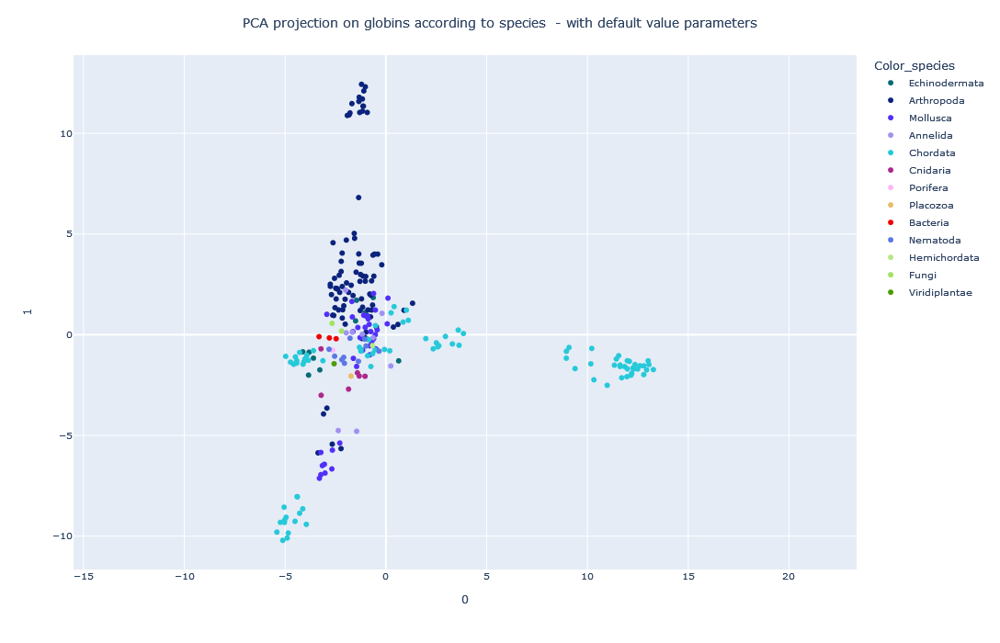

In [23]:
pca_trace= plot_embedding_interactive_bis(array_emb = X_PCA_c, df_annot = globin_annot, 
                               labels_name = "Color_species", 
                               title = "PCA projection on globins according to species  - with default value parameters",
                               color_palette = globin_palette)
pca_trace.show()

# KPCA

In [24]:
from sklearn.decomposition import KernelPCA
transformer = KernelPCA(kernel='cosine')
X_transformed = transformer.fit_transform(X_complet)

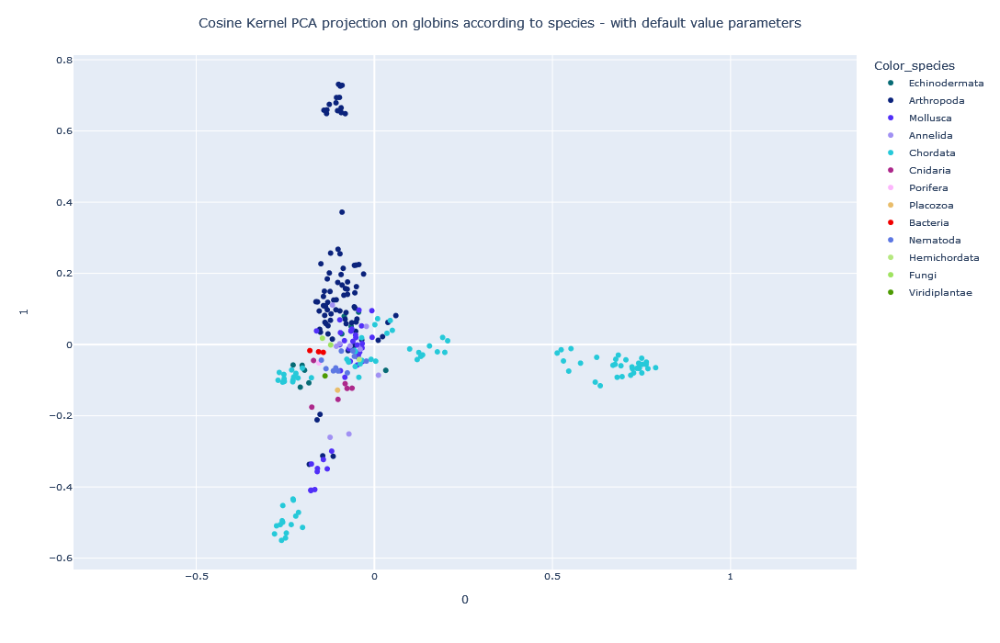

In [29]:
kpca_trace= plot_embedding_interactive_bis(array_emb = X_transformed, df_annot = globin_annot, 
                               labels_name = "Color_species", 
                               title = "Cosine Kernel PCA projection on globins according to species - with default value parameters",
                               color_palette = globin_palette) 

kpca_trace.show()

# MDS

In [121]:
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine

X_cosine= pairwise_distances(X_complet,metric='cosine')
mds_nonmetric = MDS(n_components=2,metric=True,dissimilarity='precomputed', random_state = 42)
X_m_c_t = mds_nonmetric.fit_transform(X_cosine)

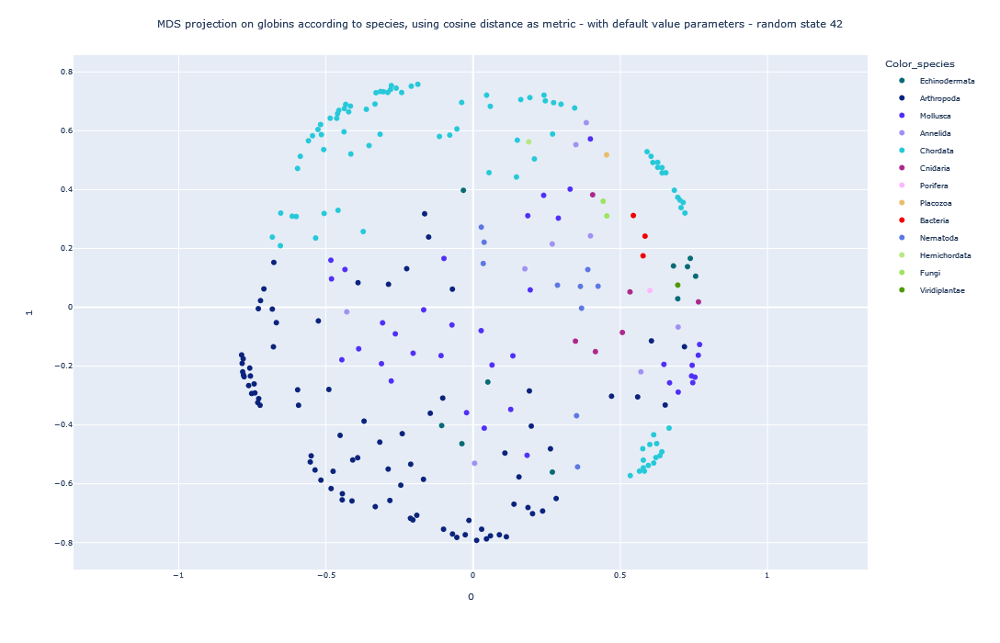

In [122]:
mds_trace= plot_embedding_interactive_bis(array_emb = X_m_c_t, df_annot = globin_annot, 
                               labels_name = "Color_species", 
                               title = "MDS projection on globins according to species, using cosine distance as metric - with default value parameters - random state 42",
                               color_palette = globin_palette, 
                               fontsize = 8)
mds_trace.show() 

# TSNE

In [119]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components = 2, random_state = 42).fit_transform(X_complet)
X_embedded.shape # give 152, 2

(252, 2)

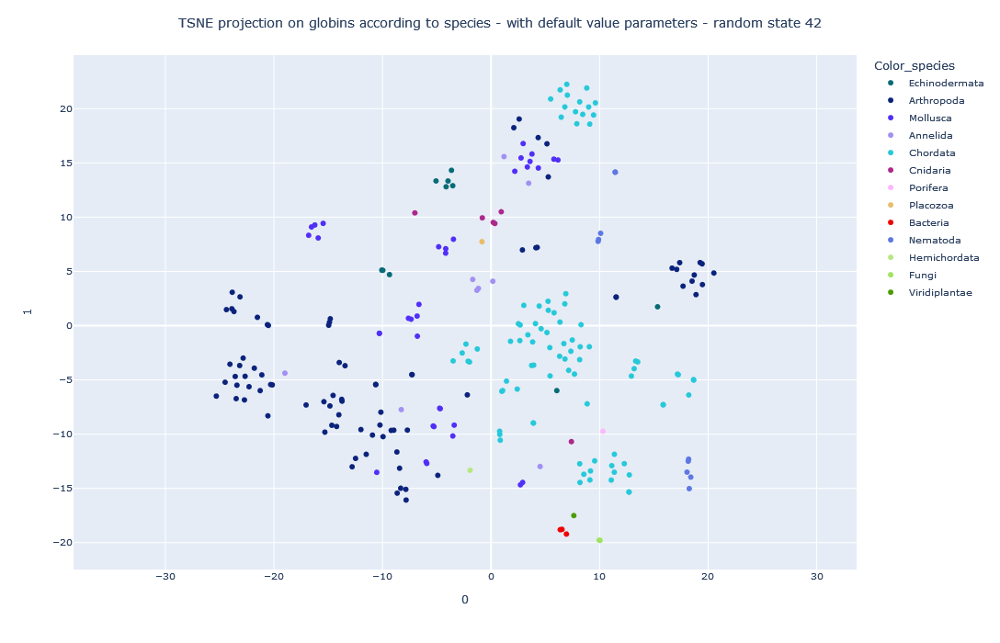

In [120]:
tsne_trace= plot_embedding_interactive_bis(array_emb = X_embedded, df_annot = globin_annot, 
                               labels_name = "Color_species", 
                               title = "TSNE projection on globins according to species - with default value parameters - random state 42",
                               color_palette = globin_palette) 
tsne_trace.show()

# UMAP

In [117]:
import umap

reducer = umap.UMAP(random_state = 42)
embedding = reducer.fit_transform(X_complet)

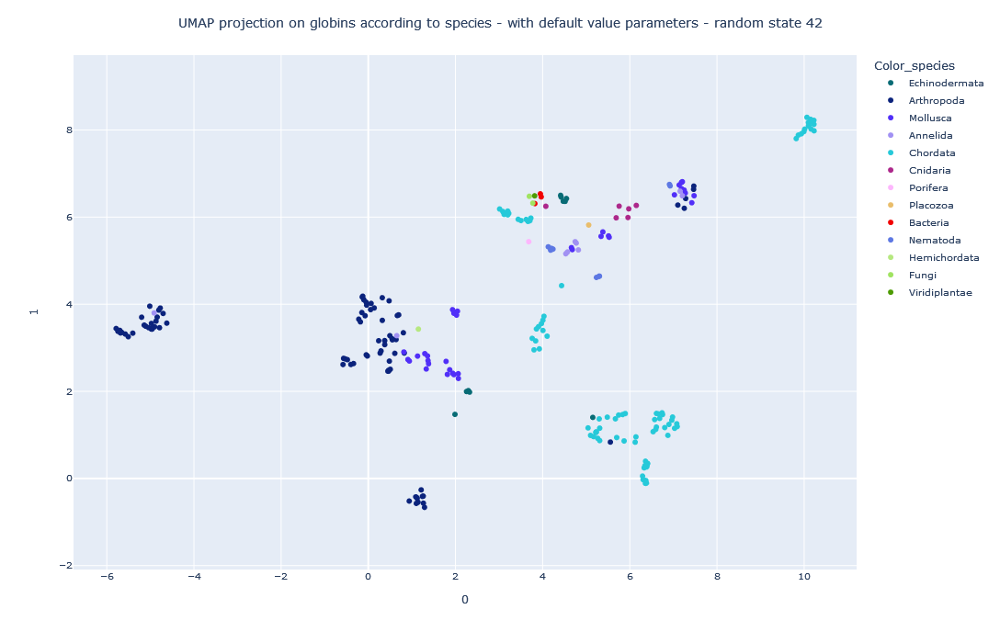

In [118]:
umap_trace= plot_embedding_interactive_bis(array_emb = embedding, df_annot = globin_annot, 
                               labels_name = "Color_species", 
                               title = "UMAP projection on globins according to species - with default value parameters - random state 42",
                               color_palette = globin_palette) 
umap_trace.show()

# IsoMap 

In [79]:
from sklearn.manifold import Isomap
iso = Isomap(n_components=2)
iso.fit(X_complet)
array_iso = iso.transform(X_complet)

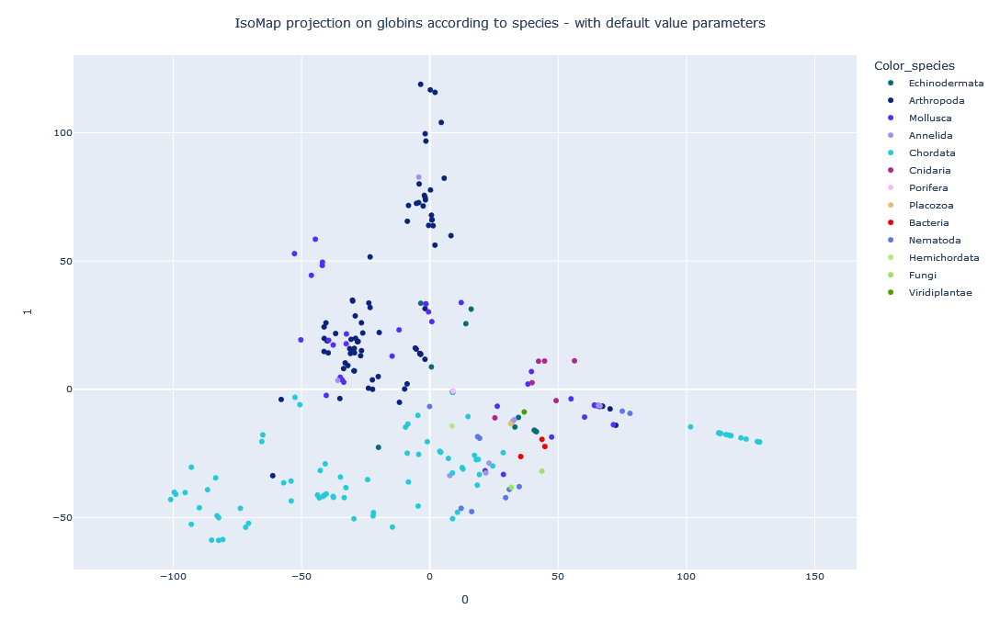

In [80]:
iso_trace= plot_embedding_interactive_bis(array_emb = array_iso, df_annot = globin_annot, 
                               labels_name = "Color_species", 
                               title = "IsoMap projection on globins according to species - with default value parameters",
                               color_palette = globin_palette)
iso_trace.show()

# Globins0.9 - by tree4

## PCA

In [90]:
pca=decomposition.PCA()
X_PCA_c= pca.fit(X_complet).transform(X_complet)

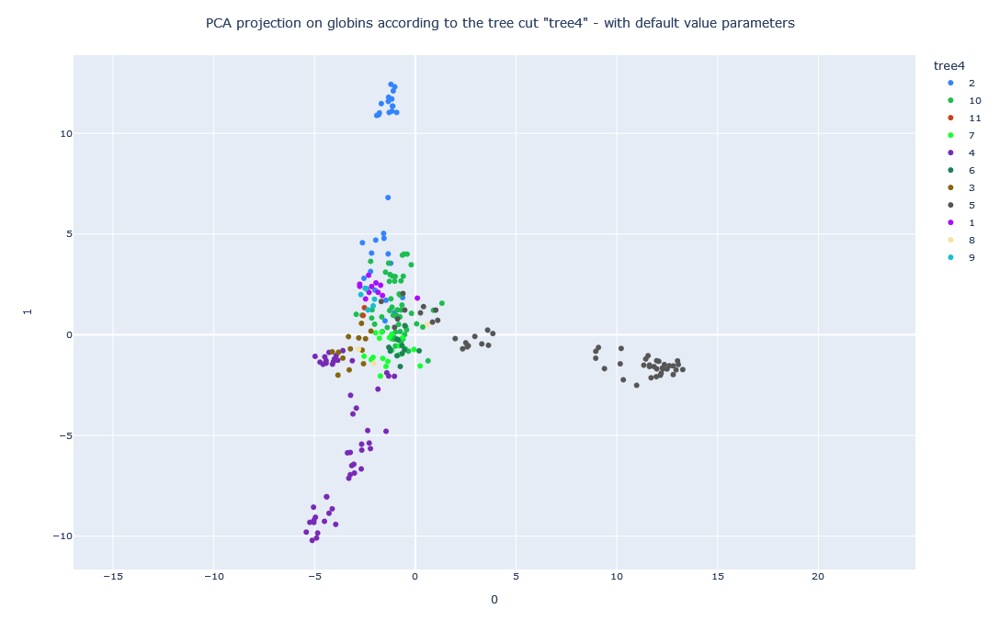

In [91]:
pca_trace= plot_embedding_interactive_bis(array_emb = X_PCA_c, df_annot = globin_annot, 
                               labels_name = "tree4", 
                               title = "PCA projection on globins according to the tree cut \"tree4\" - with default value parameters",
                               color_palette = globin_palette)
pca_trace.show()

## KPCA

In [115]:
from sklearn.decomposition import KernelPCA
transformer = KernelPCA(kernel='cosine')
X_transformed = transformer.fit_transform(X_complet)

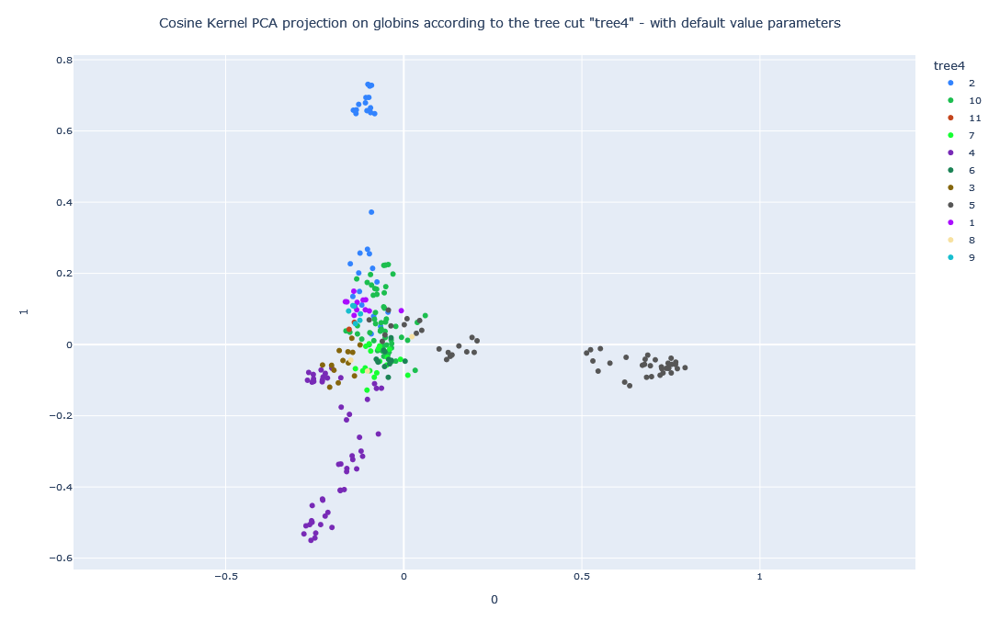

In [116]:
kpca_trace= plot_embedding_interactive_bis(array_emb = X_transformed, df_annot = globin_annot, 
                               labels_name = "tree4", 
                               title = "Cosine Kernel PCA projection on globins according to the tree cut \"tree4\" - with default value parameters",
                               color_palette = globin_palette) 
kpca_trace.show()

## MDS 

In [113]:
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine

X_cosine= pairwise_distances(X_complet,metric='cosine')
mds_nonmetric = MDS(n_components=2,metric=True,dissimilarity='precomputed', random_state = 42)
X_m_c_t = mds_nonmetric.fit_transform(X_cosine)

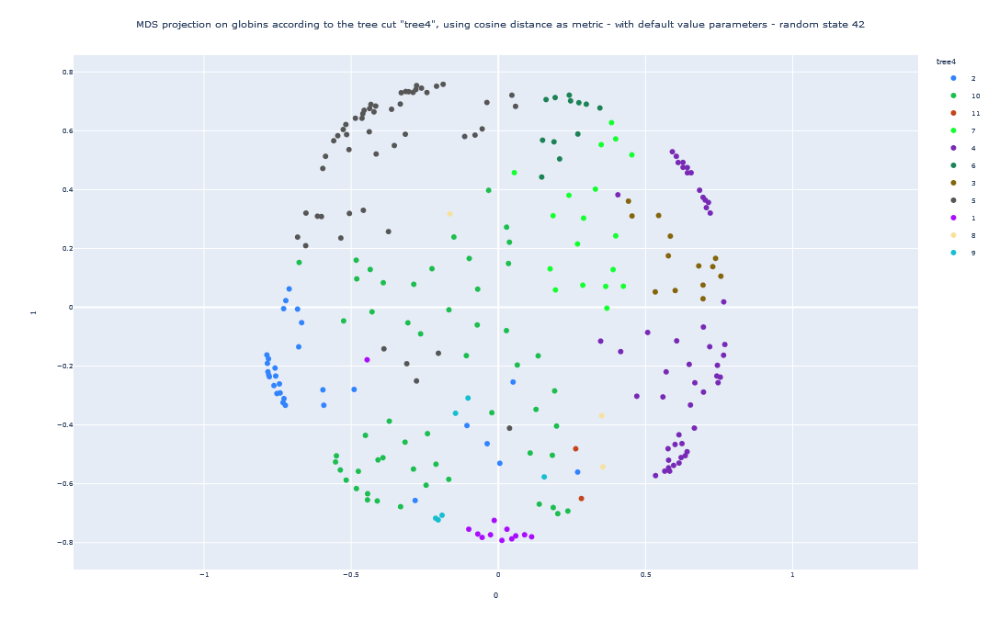

In [114]:
mds_trace= plot_embedding_interactive_bis(array_emb = X_m_c_t, df_annot = globin_annot, 
                               labels_name = "tree4", 
                               title = "MDS projection on globins according to the tree cut \"tree4\", using cosine distance as metric - with default value parameters - random state 42",
                               color_palette = globin_palette, 
                               fontsize = 7)
mds_trace.show()

## TSNE

In [111]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components = 2, random_state = 42).fit_transform(X_complet)

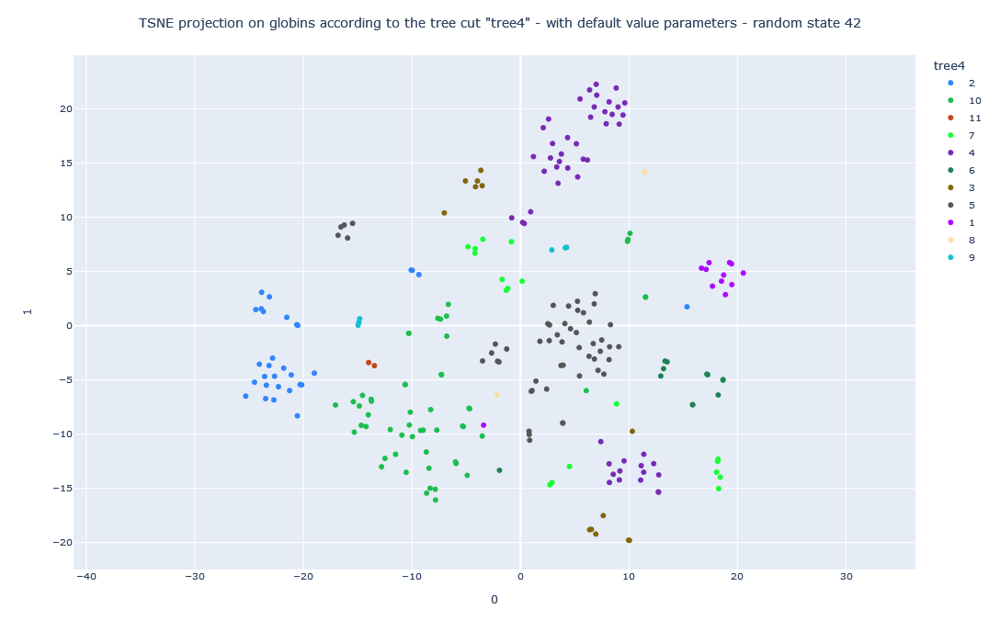

In [112]:
tsne_trace= plot_embedding_interactive_bis(array_emb = X_embedded, df_annot = globin_annot,
                               labels_name = "tree4", 
                               title = "TSNE projection on globins according to the tree cut \"tree4\" - with default value parameters - random state 42",
                               color_palette = globin_palette) 
tsne_trace.show()

## Umap

In [109]:
import umap

reducer = umap.UMAP(random_state = 42)
embedding = reducer.fit_transform(X_complet)

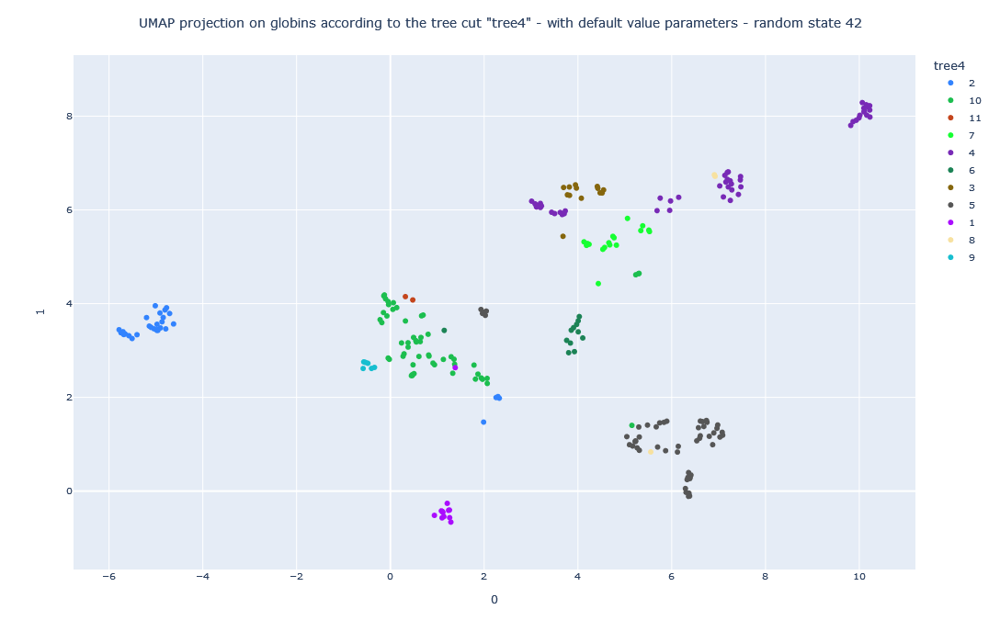

In [110]:
umap_trace= plot_embedding_interactive_bis(array_emb = embedding, df_annot = globin_annot,                        
                               labels_name = "tree4", 
                               title ="UMAP projection on globins according to the tree cut \"tree4\" - with default value parameters - random state 42",
                               color_palette = globin_palette) 
umap_trace.show()

## IsoMap

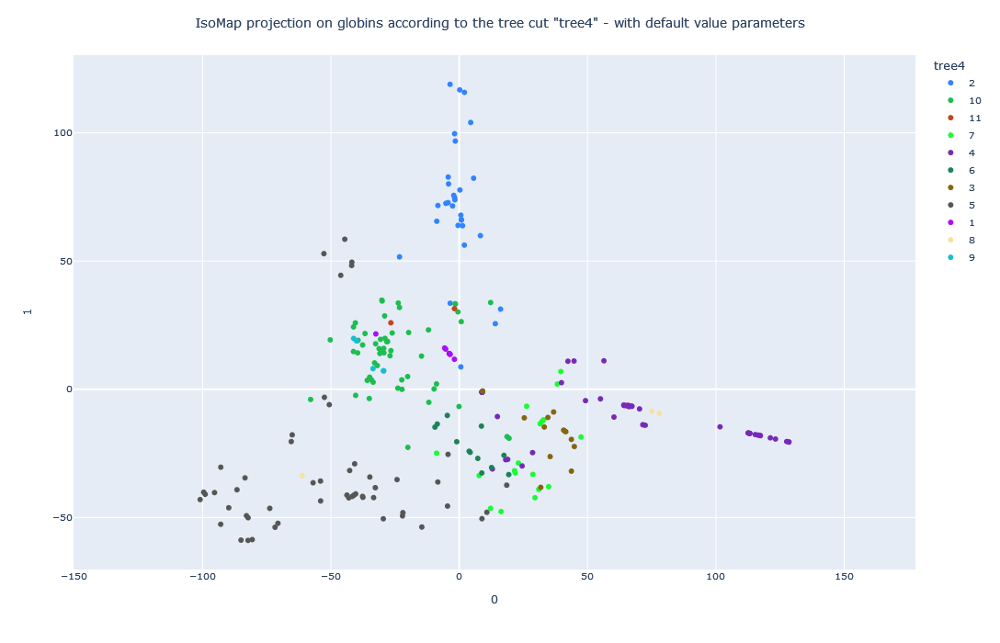

In [34]:
from sklearn.manifold import Isomap

iso = Isomap()
iso.fit(X_complet)
array_iso = iso.transform(X_complet)
iso_trace= plot_embedding_interactive_bis(array_emb = array_iso, df_annot = globin_annot, 
                               labels_name = "tree4", 
                               title = "IsoMap projection on globins according to the tree cut \"tree4\" - with default value parameters",
                               color_palette = globin_palette)
iso_trace.show()

# Globins0.9 - tree3

# PCA

In [35]:
pca=decomposition.PCA()
X_PCA_c= pca.fit(X_complet).transform(X_complet)

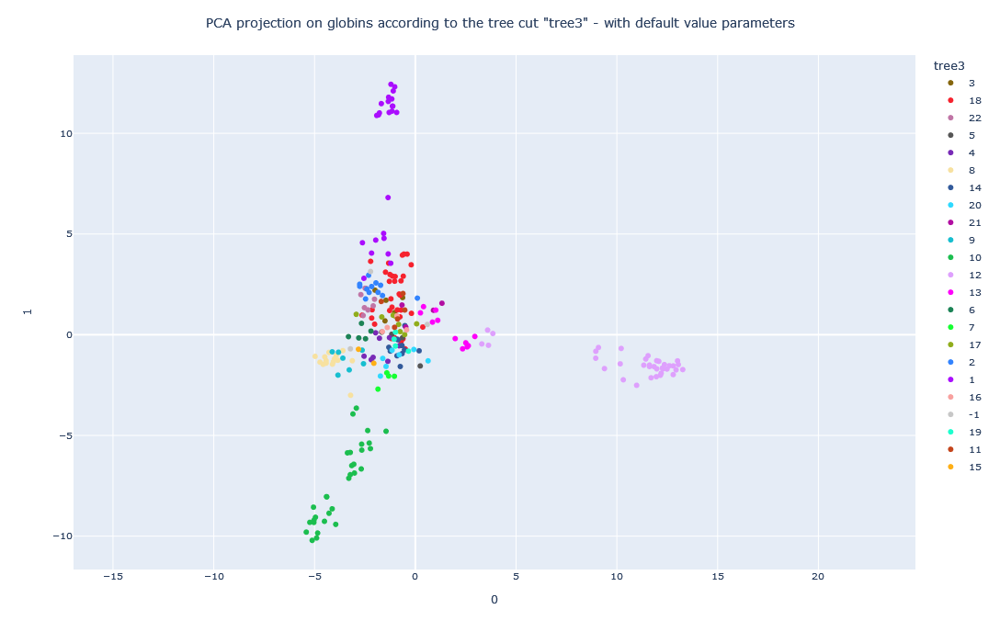

In [61]:
pca_trace= plot_embedding_interactive_bis(array_emb = X_PCA_c, df_annot = globin_annot, 
                               labels_name = "tree3", 
                               title = "PCA projection on globins according to the tree cut \"tree3\" - with default value parameters",
                               color_palette = globin_palette)
pca_trace.show()

# KPCA

In [107]:
from sklearn.decomposition import KernelPCA
transformer = KernelPCA(kernel='cosine')
X_transformed = transformer.fit_transform(X_complet)

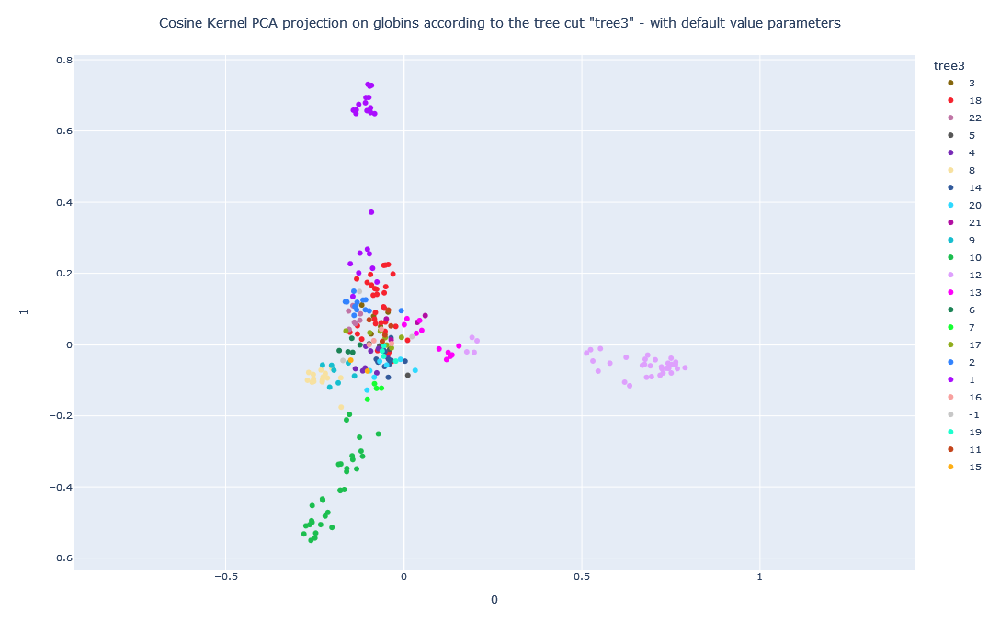

In [108]:
kpca_trace= plot_embedding_interactive_bis(array_emb = X_transformed, df_annot = globin_annot, 
                               labels_name = "tree3", 
                               title = "Cosine Kernel PCA projection on globins according to the tree cut \"tree3\" - with default value parameters",
                               color_palette = globin_palette) 
kpca_trace.show()

# MDS

In [105]:
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine

X_cosine= pairwise_distances(X_complet,metric='cosine')
mds_nonmetric = MDS(n_components=2,metric=True,dissimilarity='precomputed', random_state = 42)
X_m_c_t = mds_nonmetric.fit_transform(X_cosine)

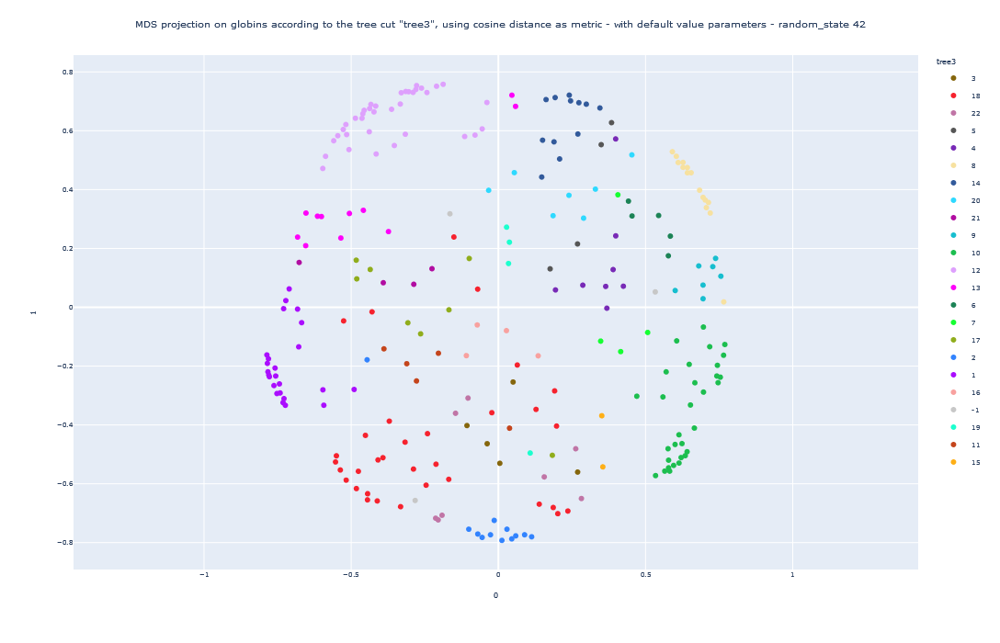

In [106]:
mds_trace= plot_embedding_interactive_bis(array_emb = X_m_c_t, df_annot = globin_annot, 
                               labels_name = "tree3", 
                               title = "MDS projection on globins according to the tree cut \"tree3\", using cosine distance as metric - with default value parameters - random_state 42",
                               color_palette = globin_palette, 
                               fontsize = 7)
mds_trace.show()

# TSNE

In [103]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components = 2, random_state = 42).fit_transform(X_complet)

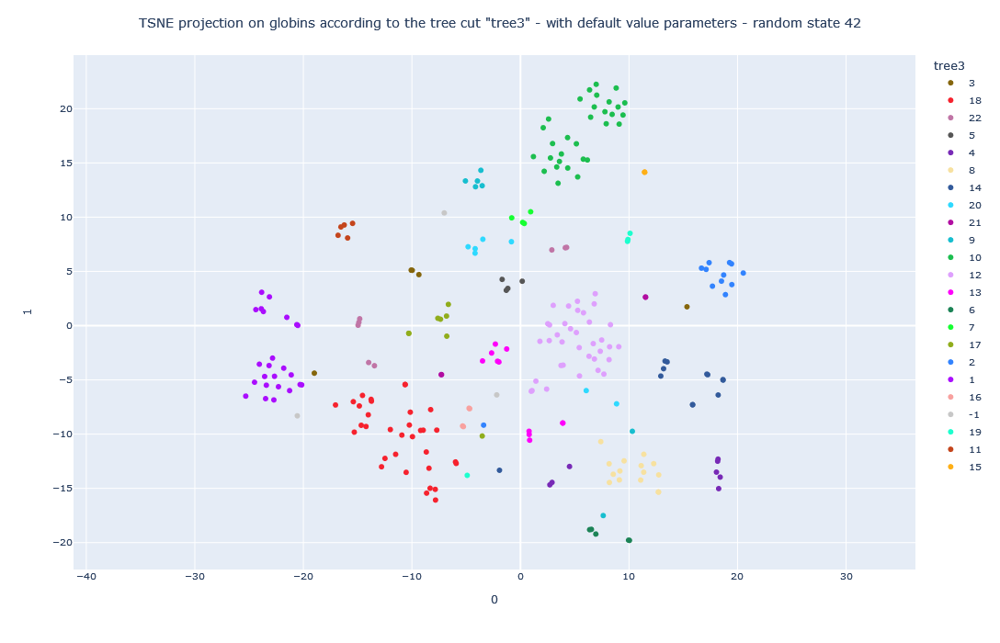

In [104]:
tsne_trace= plot_embedding_interactive_bis(array_emb = X_embedded, df_annot = globin_annot,
                               labels_name = "tree3", 
                               title = "TSNE projection on globins according to the tree cut \"tree3\" - with default value parameters - random state 42",
                               color_palette = globin_palette) 
tsne_trace.show()

# Umap

In [100]:
import umap

reducer = umap.UMAP(random_state = 42)
embedding = reducer.fit_transform(X_complet)

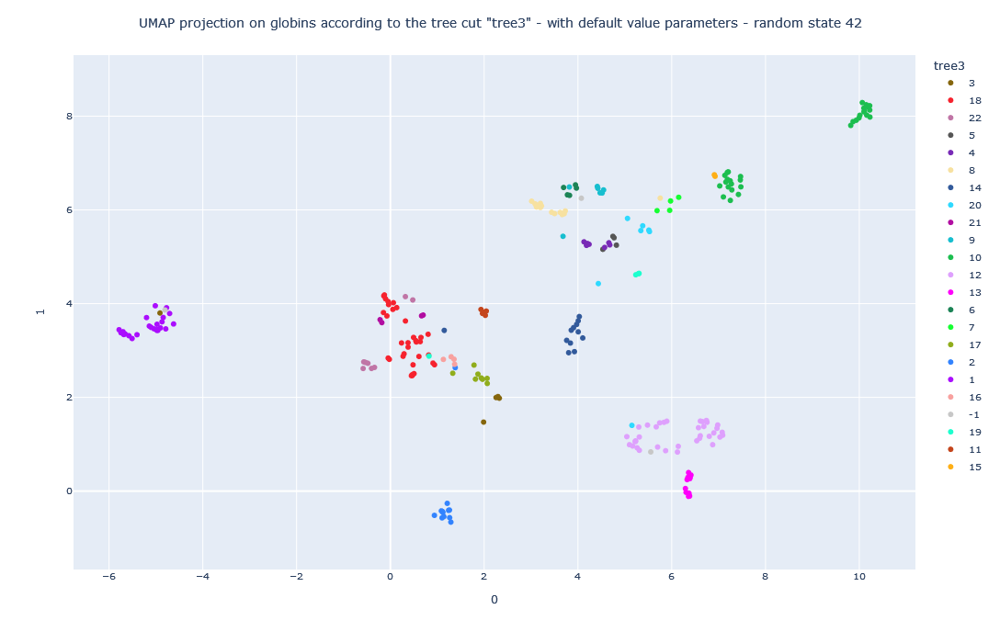

In [102]:
umap_trace= plot_embedding_interactive_bis(array_emb = embedding, df_annot = globin_annot,                        
                               labels_name = "tree3", 
                               title ="UMAP projection on globins according to the tree cut \"tree3\" - with default value parameters - random state 42",
                               color_palette = globin_palette) 
umap_trace.show()

# IsoMap

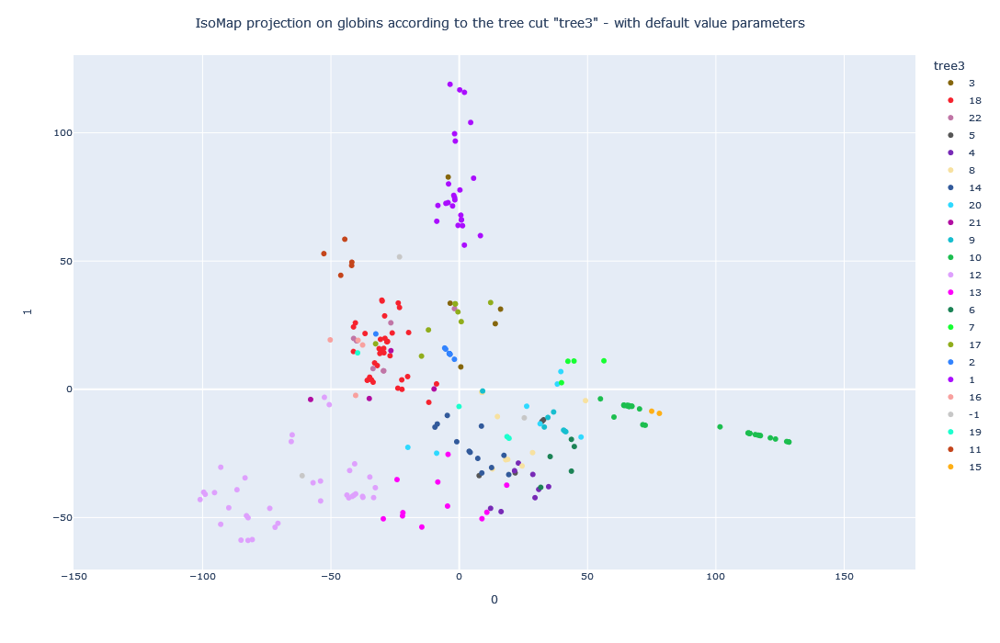

In [40]:
from sklearn.manifold import Isomap

iso = Isomap()
iso.fit(X_complet)
array_iso = iso.transform(X_complet)
iso_trace= plot_embedding_interactive_bis(array_emb = array_iso, df_annot = globin_annot, 
                               labels_name = "tree3", 
                               title = "IsoMap projection on globins according to the tree cut \"tree3\" - with default value parameters",
                               color_palette = globin_palette)
iso_trace.show()

# Globins0.9 - evo_distance

# PCA

In [14]:
pca=decomposition.PCA()
X_PCA_c= pca.fit(X_complet).transform(X_complet)

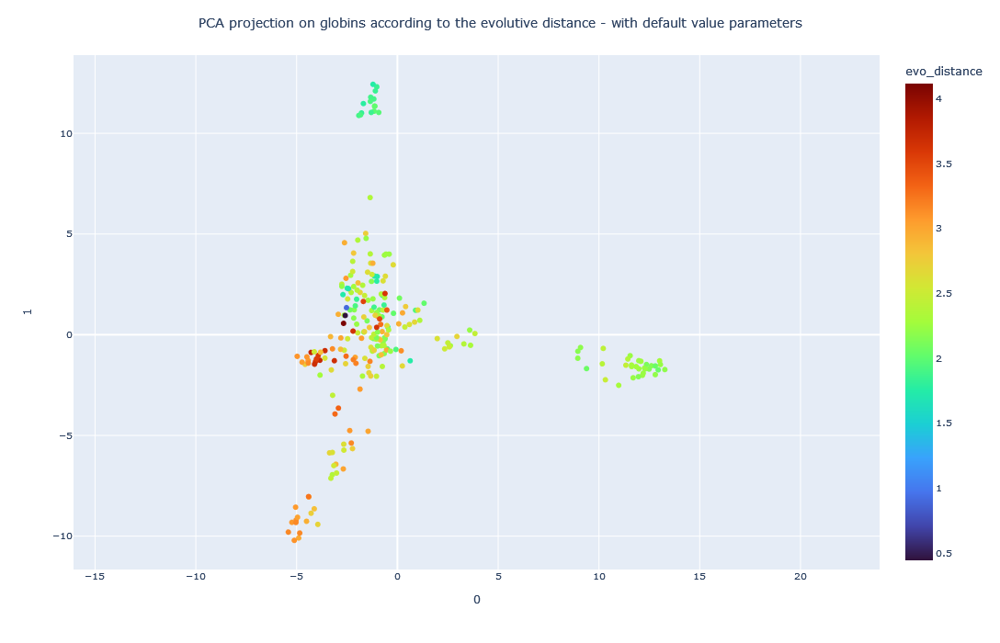

In [15]:
pca_trace= plot_embedding_interactive_bis(array_emb = X_PCA_c, df_annot = globin_annot, 
                               labels_name = "evo_distance", 
                               title = "PCA projection on globins according to the evolutive distance - with default value parameters",
                               color_palette = globin_palette)
pca_trace.show()

# KPCA

In [16]:
from sklearn.decomposition import KernelPCA
transformer = KernelPCA(kernel='cosine')
X_transformed = transformer.fit_transform(X_complet)

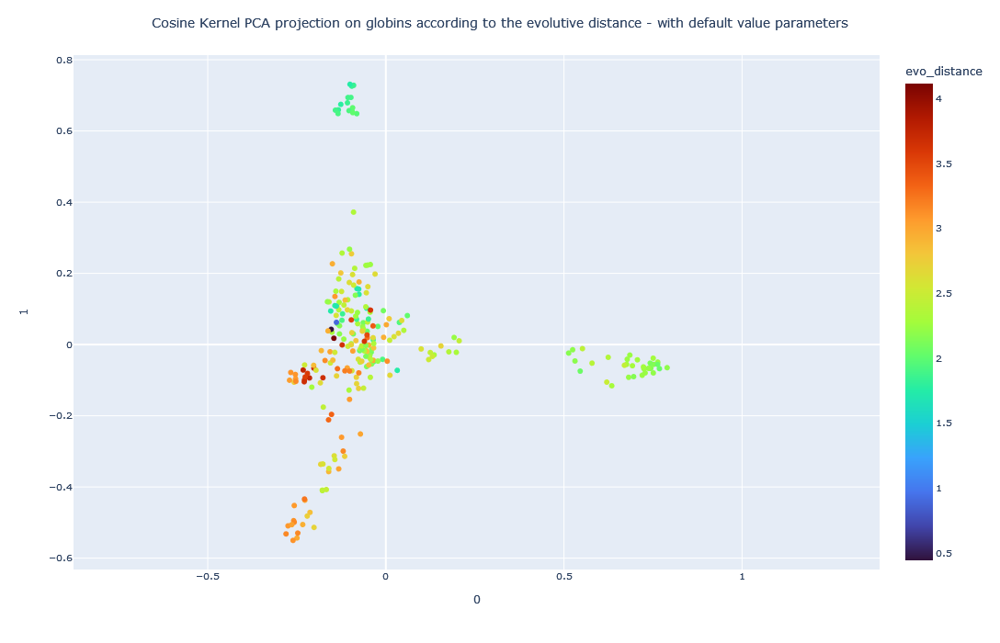

In [17]:
kpca_trace= plot_embedding_interactive_bis(array_emb = X_transformed, df_annot = globin_annot, 
                               labels_name = "evo_distance", 
                               title = "Cosine Kernel PCA projection on globins according to the evolutive distance - with default value parameters",
                               color_palette = globin_palette) 

kpca_trace.show()

# MDS

In [95]:
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine
X_cosine= pairwise_distances(X_complet,metric='cosine')
mds_nonmetric = MDS(n_components=2,metric=True,dissimilarity='precomputed', random_state = 42)
X_m_c_t = mds_nonmetric.fit_transform(X_cosine)

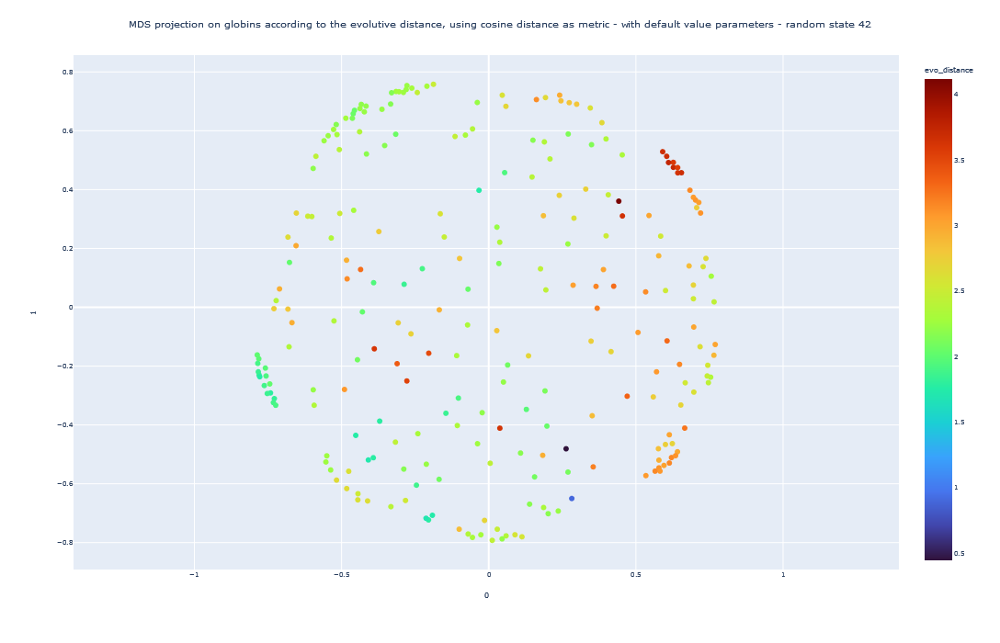

In [98]:
mds_trace= plot_embedding_interactive_bis(array_emb = X_m_c_t, df_annot = globin_annot, 
                               labels_name = "evo_distance", 
                               title = "MDS projection on globins according to the evolutive distance, using cosine distance as metric - with default value parameters - random state 42",
                               color_palette = globin_palette, 
                               fontsize = 7)
mds_trace.show()

# TSNE

In [52]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components = 2, random_state = 42).fit_transform(X_complet)

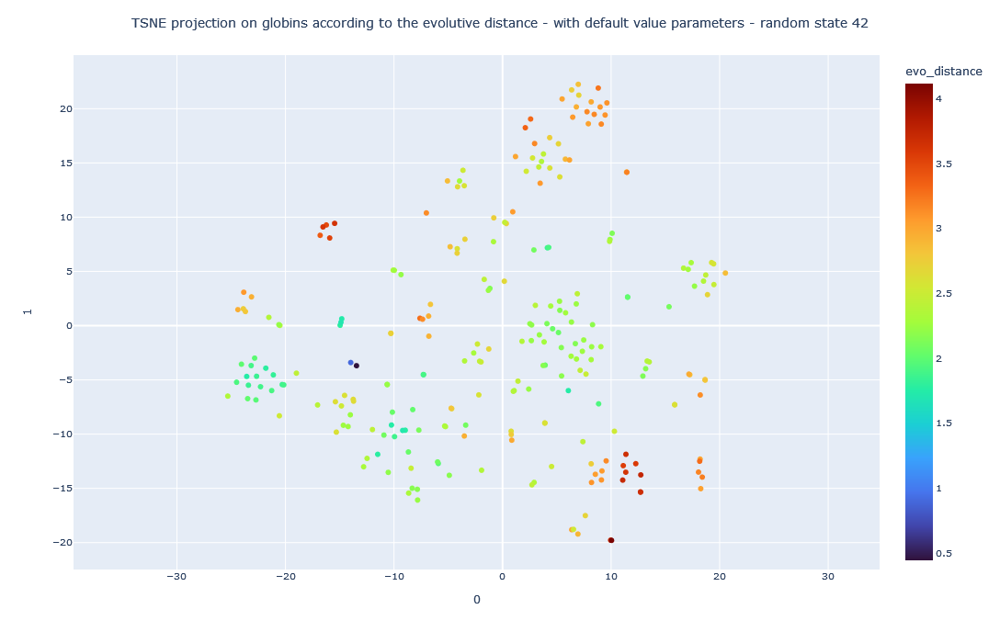

In [54]:
tsne_trace= plot_embedding_interactive_bis(array_emb = X_embedded, df_annot = globin_annot,
                               labels_name = "evo_distance", 
                               title = "TSNE projection on globins according to the evolutive distance - with default value parameters - random state 42",
                               color_palette = globin_palette) 
tsne_trace.show()

# Umap

In [45]:
import umap

reducer = umap.UMAP(random_state = 42)
embedding = reducer.fit_transform(X_complet)

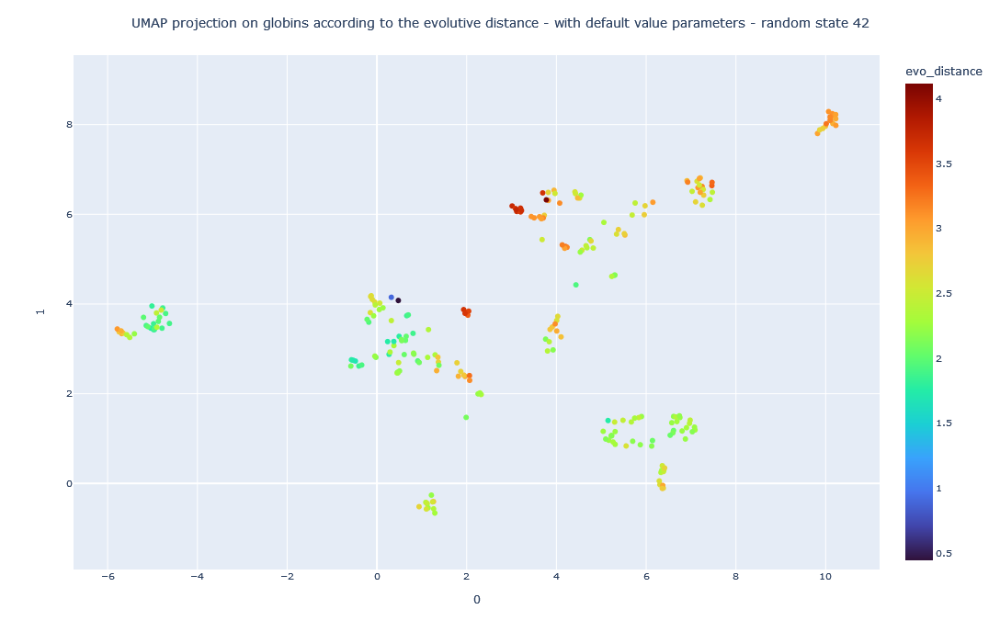

In [51]:
umap_trace= plot_embedding_interactive_bis(array_emb = embedding, df_annot = globin_annot,                        
                               labels_name = "evo_distance", 
                               title ="UMAP projection on globins according to the evolutive distance - with default value parameters - random state 42",
                               color_palette = globin_palette) 
umap_trace.show()

# IsoMap

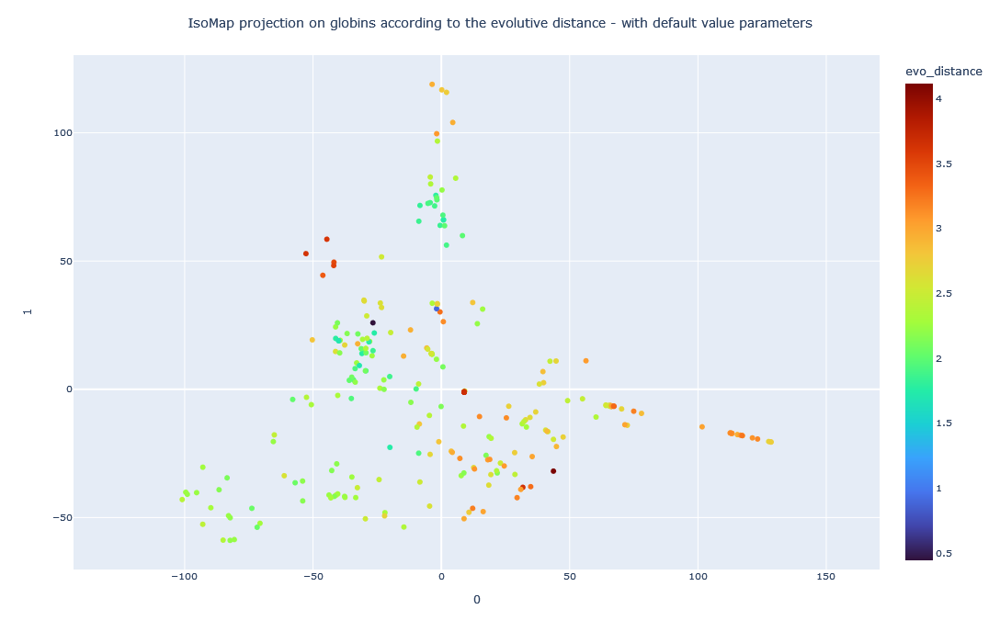

In [89]:
from sklearn.manifold import Isomap

iso = Isomap()
iso.fit(X_complet)
array_iso = iso.transform(X_complet)
iso_trace= plot_embedding_interactive_bis(array_emb = array_iso, df_annot = globin_annot, 
                               labels_name = "evo_distance", 
                               title = "IsoMap projection on globins according to the evolutive distance - with default value parameters",
                               color_palette = globin_palette
                               )
iso_trace.show()